In [1]:
import pandas as pd
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer

# Download NLTK stopwords if not already downloaded
nltk.download('stopwords')
nltk.download('punkt')

# Read the "corpus_dataset.xlsx" file into a Pandas DataFrame
file_path = "exoskeleton_literatures.xlsx"
df = pd.read_excel(file_path)
Year = df['Year'].tolist()
Title = df['Title'].tolist()
Doc_Type= df['Type'].tolist()


# Define a function for text preprocessing
def preprocess_text(text):
    if isinstance(text, str):  # Check if the text is a string
        # Remove all punctuation except commas
        text = re.sub(r'[^\w\s,]', '', text)  # 新增代码行：保留字母数字字符、空白字符和逗号

        # Tokenization
        words = word_tokenize(text)

        # Remove stopwords
        stop_words = set(stopwords.words('english'))
        filtered_words = [word for word in words if word.lower() not in stop_words]

        # Stemming (using Porter stemmer)
        stemmer = PorterStemmer()
        stemmed_words = [stemmer.stem(word) for word in filtered_words]

        # Join the cleaned words back into a single string
        cleaned_text = ' '.join(stemmed_words)

        return cleaned_text
    else:
        return text  # Return the original text for non-string values
    
# Apply the preprocessing function to the "Corpus" column
df['Cleaned_Corpus'] = df.apply(lambda row: row['Title'] + ', ' + row['Abstract'], axis=1)
df['Cleaned_Corpus'] = df['Cleaned_Corpus'].apply(preprocess_text).fillna('')



# Display the new DataFrame with the correct syntax for selecting multiple columns
print(df[['IDs', 'Title', 'Cleaned_Corpus']].head())


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Eric\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Eric\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


   IDs                                              Title  \
0    1  Leveraging Interactional Sociology for Trust A...   
1    2  Robot’s Gendering Trouble: A Scoping Review of...   
2    3  SBI-DHGR: Skeleton-based intelligent dynamic h...   
3    4  Injection-on-Skin Granular Adhesive for Intera...   
4    5  Modelling for design and evaluation of industr...   

                                      Cleaned_Corpus  
0  leverag interact sociolog trust analysi multip...  
1  robot gender troubl scope review gender humano...  
2  sbidhgr skeletonbas intellig dynam hand gestur...  
3  injectiononskin granular adhes interact humanm...  
4  model design evalu industri exoskeleton system...  


In [2]:
# Display the cleaned corpus
df['Cleaned_Corpus'].tolist()
# df['Type'].tolist()
# df['Year'].tolist()

['leverag interact sociolog trust analysi multiparti humanrobot interact , leverag interact sociolog theori , multimod behavior featur recurr neural architectur , increment build comput model trust analysi multiparti humanrobot interact hri show model perform improv model group dynam differ granular ie group member , dyadic , group whole , ii model usersrobot interact questionansw sequenc 2023 ownerauthor',
 'robot gender troubl scope review gender humanoid robot effect hri , discuss around gender humanoid robot gain traction last year lay basi full comprehens robot gender understood within humanrobot interact hri communityi , manipul , context , effect yield peopl percept interact robotsw perform scope review literatur identifi 553 paper relev review retriev 5 differ databas final sampl review paper includ 35 paper written 2005 2021 , involv total 3902 particip articl , thoroughli summar paper report inform object assumpt gender ie , definit reason manipul gender , manipul robot gende

## 计算 components
#### 第一种方法是手肘法

c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergenc

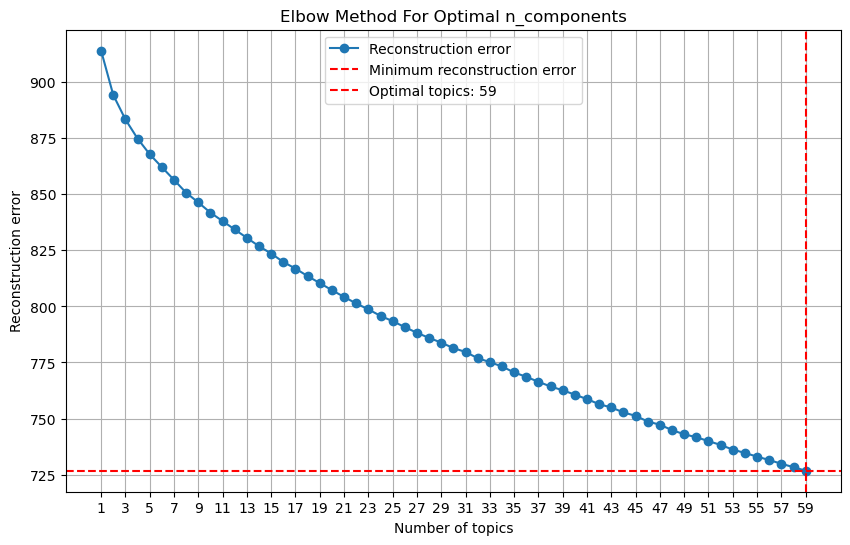

In [16]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import numpy as np

corpus = df['Cleaned_Corpus'].tolist()

# 设置向量化器
vectorizer = CountVectorizer(max_df=0.8, min_df=10, stop_words="english")
X = vectorizer.fit_transform(corpus)

# 计算不同主题数量下的模型拟合度或重构误差
n_components_list = range(1, 60)  # 考虑从1到40的主题数量
reconstruction_errors = []

for n_components in n_components_list:
    nmf = NMF(n_components=n_components, init='random', random_state=0)
    nmf.fit(X)
    reconstruction_errors.append(nmf.reconstruction_err_)

# 找到重构误差最小的点
min_error = min(reconstruction_errors)
min_error_index = reconstruction_errors.index(min_error) + 1  # 加1是因为索引从0开始，但主题数量从1开始

# 绘制手肘图
plt.figure(figsize=(10, 6))
plt.plot(n_components_list, reconstruction_errors, marker='o', label='Reconstruction error')
plt.axhline(y=min_error, color='r', linestyle='--', label='Minimum reconstruction error')
plt.axvline(x=min_error_index, color='r', linestyle='--', label=f'Optimal topics: {min_error_index}')

plt.title('Elbow Method For Optimal n_components')
plt.xlabel('Number of topics')
plt.ylabel('Reconstruction error')
plt.xticks(np.arange(min(n_components_list), max(n_components_list)+1, 2))
plt.legend()
plt.grid(True)
plt.show()



#### 随机步长手肘法

c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergenc

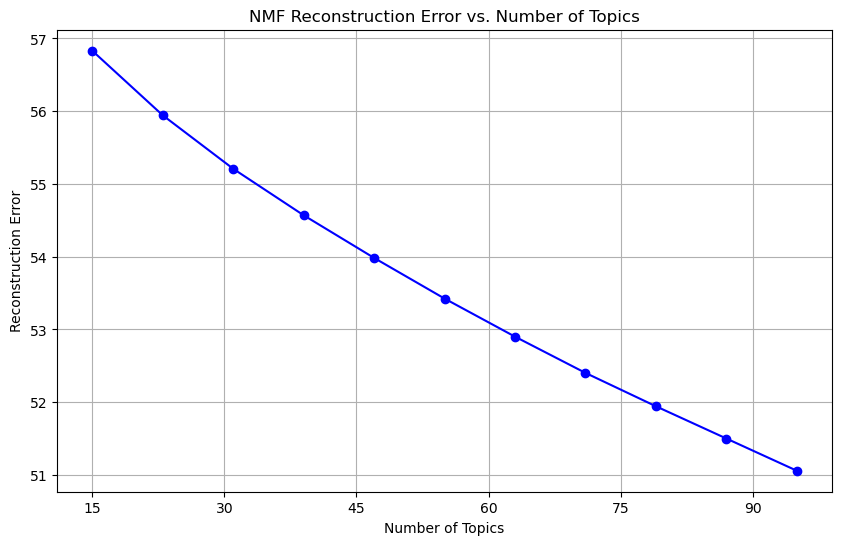

In [17]:
# 导入必要的库
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np
import random

# 设置随机步长进行探索性分析，范围为(15, 100)
step_range = range(15, 101, random.randint(5, 20))  # 步长为15到20之间的随机数

# 初始化向量化器
vectorizer = TfidfVectorizer(max_df=0.8, min_df=10, stop_words="english")
X = vectorizer.fit_transform(corpus)

# 存储每个步长的重构误差
reconstruction_errors = []

# 对每个随机步长拟合NMF模型并计算重构误差
for n_components in step_range:
    nmf = NMF(n_components=n_components, init='random', random_state=0)
    nmf.fit(X)
    reconstruction_errors.append(nmf.reconstruction_err_)

# 绘制手肘图
plt.figure(figsize=(10, 6))
plt.plot(list(step_range), reconstruction_errors, marker='o', linestyle='-', color='b')
plt.title('NMF Reconstruction Error vs. Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Reconstruction Error')
plt.xticks(np.arange(min(step_range), max(step_range)+1, 15))
plt.grid(True)
plt.show()


#### 计算主题一致性, 反算法

In [18]:
from gensim.corpora.dictionary import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from gensim.matutils import Sparse2Corpus
from sklearn.feature_extraction.text import CountVectorizer

# 1. 使用CountVectorizer转换文本数据
vectorizer = CountVectorizer(max_df=0.8, min_df=10, stop_words='english')
X = vectorizer.fit_transform(corpus)

# 2. 创建Gensim兼容的字典和语料库
corpus_gensim = Sparse2Corpus(X, documents_columns=False)
dictionary = Dictionary.from_corpus(corpus_gensim, id2word=dict((id, word) for word, id in vectorizer.vocabulary_.items()))

# 3. 使用训练好的NMF模型的主题词汇创建一个伪Gensim模型
# 假设nmf是你的训练好的NMF模型
topics = []
for topic_idx, topic in enumerate(nmf.components_):
    top_features_ind = topic.argsort()[:-10 - 1:-1]
    topics.append([dictionary[id] for id in top_features_ind])

# 4. 计算主题一致性得分
cm = CoherenceModel(topics=topics, texts=[doc.split() for doc in corpus], dictionary=dictionary, coherence='c_v')
coherence = cm.get_coherence()
print("Coherence Score: ", coherence)


Coherence Score:  0.542534485217312


## 继续计算components
#### 试算结合上一步的做法

c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergenc

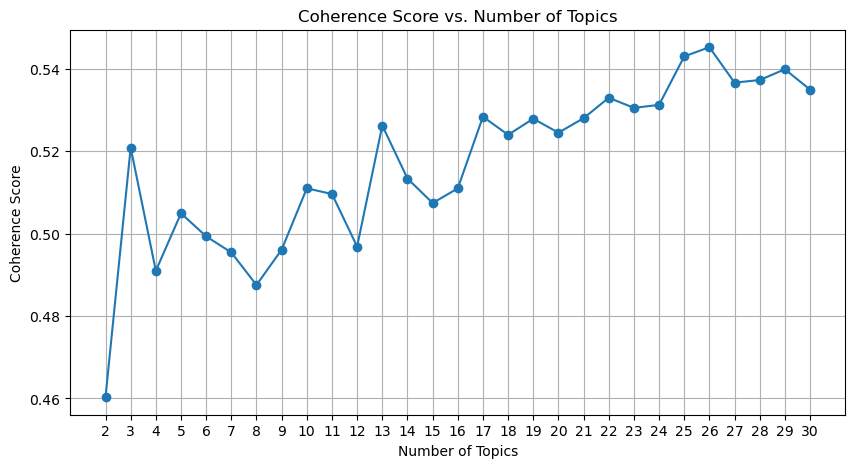

In [19]:
# 假设 corpus 是你的文本数据
coherence_scores = []
n_components_list = range(2, 31)  # 探索的主题数量范围

for n_components in n_components_list:
    # 训练NMF模型
    nmf_model = NMF(n_components=n_components, init='random', random_state=0)
    W = nmf_model.fit_transform(X)  # X 是CountVectorizer的输出
    
    # 获取每个主题的顶级词汇
    topics = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        top_features_ind = topic.argsort()[:-10 - 1:-1]
        topics.append([dictionary[id] for id in top_features_ind])
    
    # 计算一致性得分
    cm = CoherenceModel(topics=topics, texts=[doc.split() for doc in corpus], dictionary=dictionary, coherence='c_v')
    coherence = cm.get_coherence()
    coherence_scores.append(coherence)

# 绘制主题数量与一致性得分的关系图
plt.figure(figsize=(10, 5))
plt.plot(n_components_list, coherence_scores, marker='o')
plt.title("Coherence Score vs. Number of Topics")
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.xticks(n_components_list)
plt.grid(True)
plt.show()


## 正式开始 topice-wizard

In [3]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline
from topicwizard.pipeline import make_topic_pipeline
import numpy as np
from topicwizard.figures import topic_barcharts, word_map

corpus = df['Cleaned_Corpus'].tolist()
group_labels= df['Type'].tolist()


# Setting up topic modeling pipeline
bow_vectorizer = CountVectorizer(max_df=0.8, min_df=10, stop_words="english")
nmf = NMF(n_components=26)  # You can adjust the number of topics as needed

# Fitting the topic modeling pipeline
pipeline = make_pipeline(bow_vectorizer, nmf)
pipeline.fit(corpus)
topic_data = pipeline.transform(corpus)

# Display the shape of the topic data
print("Topic data shape:", topic_data.shape)

c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Topic data shape: (3760, 26)


## 获取每个主题的主要词汇

In [4]:
# 获取词汇表
feature_names = bow_vectorizer.get_feature_names_out()

# 获取每个主题的主要词汇
n_top_words = 10  # 你可以调整这个数字
for topic_idx, topic in enumerate(nmf.components_):
    print(f"Topic #{topic_idx + 1}:")
    print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))
    print()


Topic #1:
robot environ humanoid paper servic mobil develop autonom experi peopl

Topic #2:
exoskeleton passiv lower reduc load effect present lift studi simul

Topic #3:
method propos base map object detect estim algorithm result inform

Topic #4:
control dynam imped strategi adapt track forc propos base disturb

Topic #5:
interact humanrobot hri natur physic scenario collabor paper commun languag

Topic #6:
human motion behavior intent predict collabor action agent bodi understand

Topic #7:
model simul dynam predict gener base analysi comput perform compar

Topic #8:
design mechan optim paper prototyp base simul kinemat analysi novel

Topic #9:
construct worker safeti industri risk oper studi work humanrobot collabor

Topic #10:
task perform collabor work action object humanrobot execut particip plan

Topic #11:
use result differ data techniqu make implement test obtain approach

Topic #12:
actuat soft stiff forc mechan applic pneumat perform materi devic

Topic #13:
joint gait walk

In [22]:
# 为每个文档确定最相关的主题
df['Dominant_Topic'] = np.argmax(topic_data, axis=1) + 1  # 加 1 是为了使主题编号从 1 开始

# 显示前几行数据，看看主题如何分配
print(df[['IDs', 'Title', 'Dominant_Topic']].head())

   IDs                                              Title  Dominant_Topic
0    1  Leveraging Interactional Sociology for Trust A...               5
1    2  Robot’s Gendering Trouble: A Scoping Review of...               1
2    3  SBI-DHGR: Skeleton-based intelligent dynamic h...              18
3    4  Injection-on-Skin Granular Adhesive for Intera...              19
4    5  Modelling for design and evaluation of industr...               7


## 主题分布图和词云图

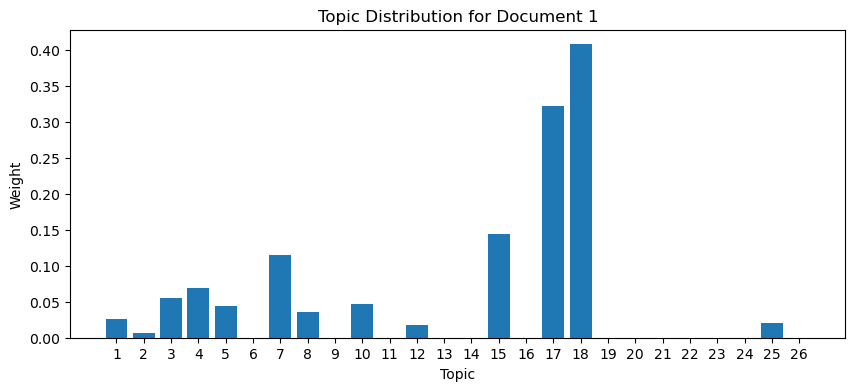

In [23]:
import matplotlib.pyplot as plt

# 假设选择第一个文档
doc_topic = topic_data[2]

# 绘制主题分布图
plt.figure(figsize=(10, 4))
plt.bar(range(1, 27), doc_topic)
plt.xlabel('Topic')
plt.ylabel('Weight')
plt.title('Topic Distribution for Document 1')
plt.xticks(range(1, 27))
plt.show()


C:\Users\Eric\AppData\Local\Temp\ipykernel_13860\1478502227.py:29: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  axs[1].plot(x, p, 'k--', linewidth=2, color='red')


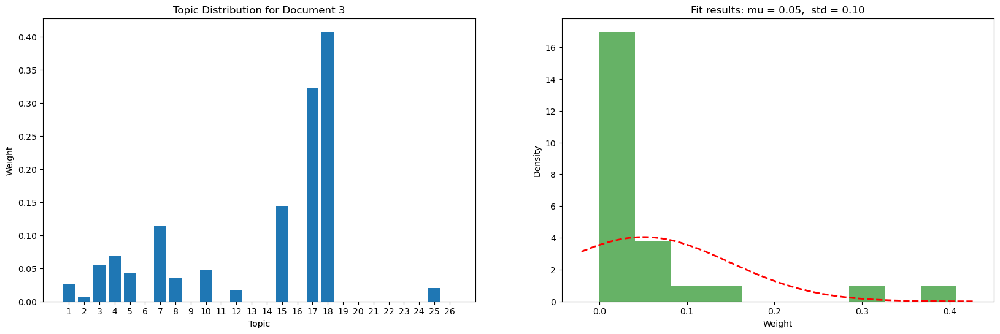

In [24]:
import matplotlib.pyplot as plt
from scipy.stats import norm
import numpy as np

# 假设选择第一个文档
doc_topic = topic_data[2]

# 设置子图
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# 第一个子图: 绘制主题分布条形图
axs[0].bar(range(1, 27), doc_topic)
axs[0].set_xlabel('Topic')
axs[0].set_ylabel('Weight')
axs[0].set_title('Topic Distribution for Document 3')
axs[0].set_xticks(range(1, 27))

# 第二个子图: 绘制拟合正态分布的直方图和PDF曲线
# 计算直方图数据
n, bins, patches = axs[1].hist(doc_topic, bins=10, density=True, alpha=0.6, color='g')

# 拟合正态分布
mu, std = norm.fit(doc_topic)

# 绘制PDF
xmin, xmax = axs[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
axs[1].plot(x, p, 'k--', linewidth=2, color='red')

# 设置图的其余部分
axs[1].set_title('Fit results: mu = %.2f,  std = %.2f' % (mu, std))
axs[1].set_xlabel('Weight')
axs[1].set_ylabel('Density')

plt.show()



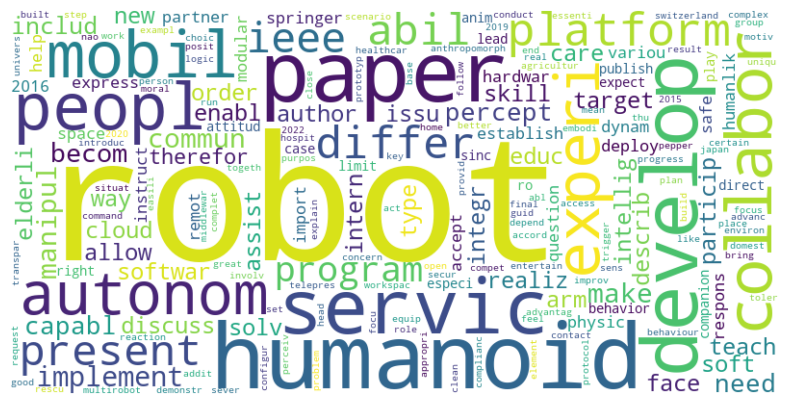

In [25]:
from wordcloud import WordCloud

# 选择第一个主题
topic_words = {word: value for word, value in zip(feature_names, nmf.components_[0])}

# 生成词云
wordcloud = WordCloud(width=800, height=400, background_color ='white').generate_from_frequencies(topic_words)

# 展示词云图
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


## 计算主题相似性和文档主题分布可视化
#####  相似性通过余弦相似度来实现

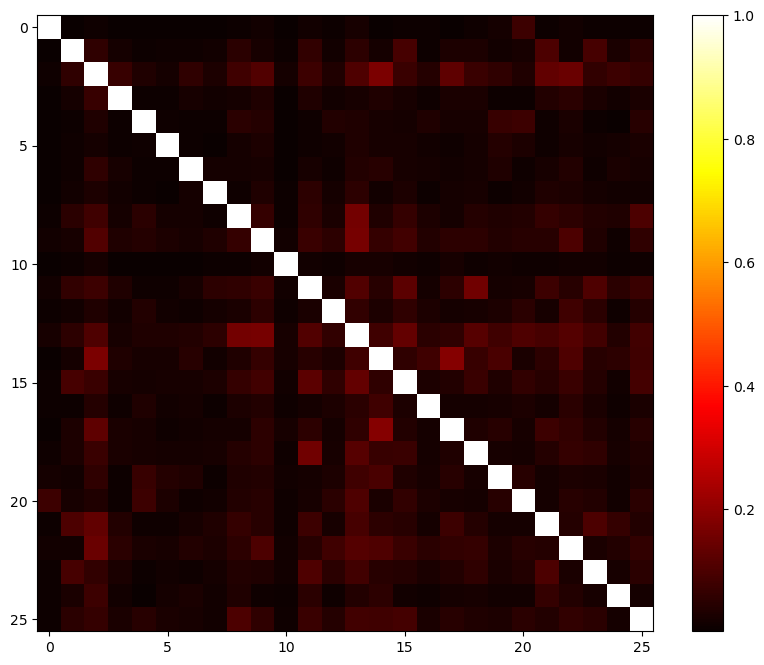

In [26]:
from sklearn.metrics.pairwise import cosine_similarity

# 计算所有主题之间的相似度
topic_similarity = cosine_similarity(nmf.components_)

# 展示相似度矩阵
plt.figure(figsize=(10, 8))
plt.imshow(topic_similarity, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()


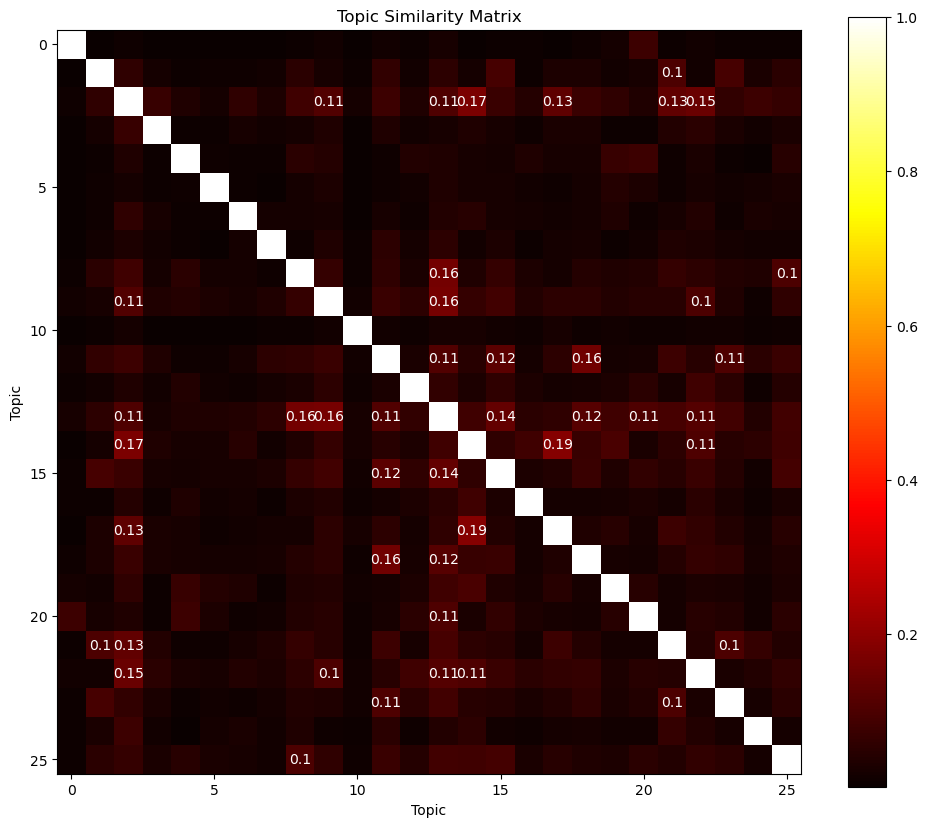

In [27]:
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# 假设 nmf.components_ 已经根据你的NMF模型计算好了
# 计算所有主题之间的相似度
topic_similarity = cosine_similarity(nmf.components_)

# 展示相似度矩阵
fig, ax = plt.subplots(figsize=(12, 10))
cax = ax.imshow(topic_similarity, cmap='hot', interpolation='nearest')

# 添加颜色条
fig.colorbar(cax)

# 在热图的每个单元格中添加数值文本，只显示相似度 >= 0.1 的值
for i in range(topic_similarity.shape[0]):
    for j in range(topic_similarity.shape[1]):
        if topic_similarity[i, j] >= 0.1:  # 只显示大于或等于0.1的相似度值
            ax.text(j, i, np.around(topic_similarity[i, j], decimals=2),
                    ha="center", va="center", color="w")

ax.set_title("Topic Similarity Matrix")
plt.xlabel("Topic")
plt.ylabel("Topic")
plt.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3760 samples in 0.001s...
[t-SNE] Computed neighbors for 3760 samples in 0.302s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3760
[t-SNE] Computed conditional probabilities for sample 2000 / 3760
[t-SNE] Computed conditional probabilities for sample 3000 / 3760
[t-SNE] Computed conditional probabilities for sample 3760 / 3760
[t-SNE] Mean sigma: 0.105759
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.554871
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


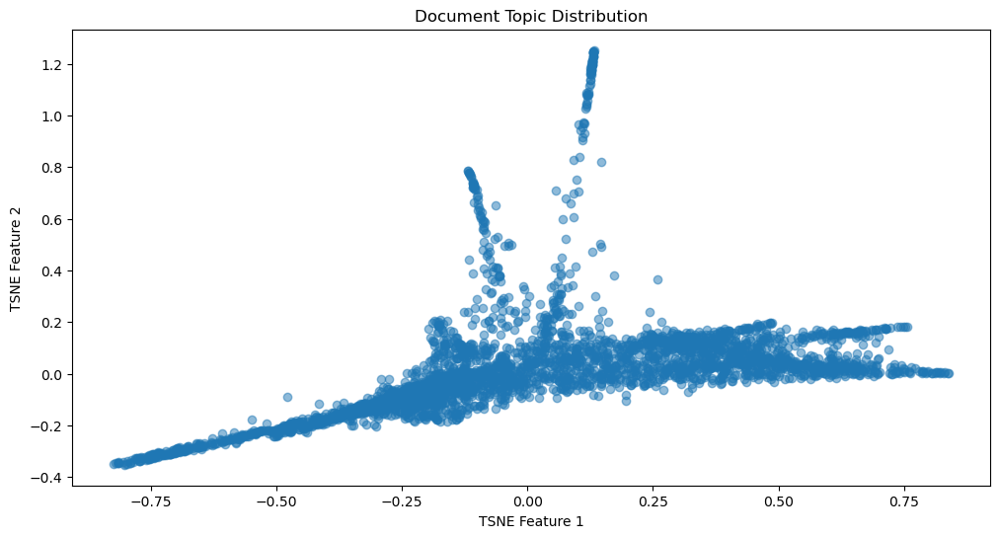

In [28]:
from sklearn.manifold import TSNE

# 运行t-SNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=250)
tsne_nmf = tsne_model.fit_transform(topic_data)

# 绘制
plt.figure(figsize=(12, 6))
plt.scatter(tsne_nmf[:, 0], tsne_nmf[:, 1], alpha=0.5)
plt.xlabel('TSNE Feature 1')
plt.ylabel('TSNE Feature 2')
plt.title('Document Topic Distribution')
plt.show()


### 美化这个图并聚类

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3760 samples in 0.001s...
[t-SNE] Computed neighbors for 3760 samples in 0.235s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3760
[t-SNE] Computed conditional probabilities for sample 2000 / 3760
[t-SNE] Computed conditional probabilities for sample 3000 / 3760
[t-SNE] Computed conditional probabilities for sample 3760 / 3760
[t-SNE] Mean sigma: 0.105759
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.554871
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


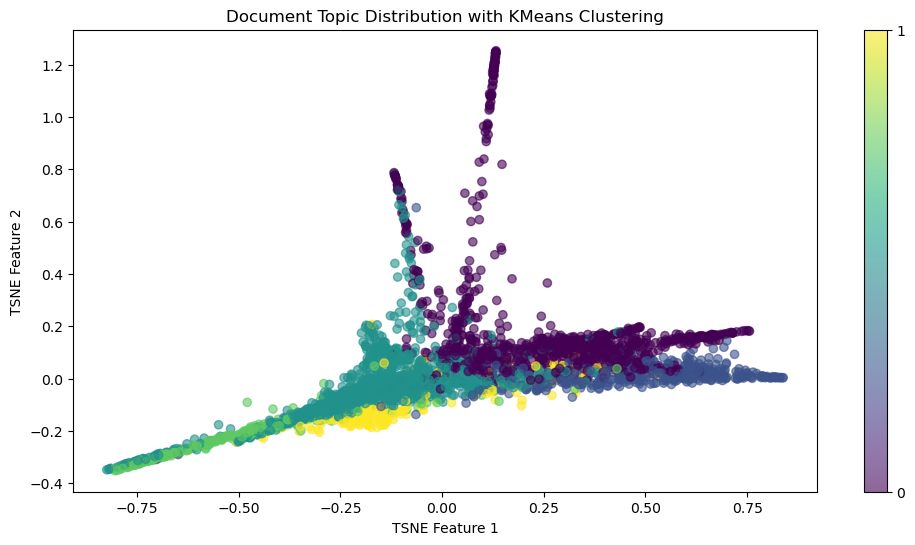

In [29]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# 运行t-SNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=250)
tsne_nmf = tsne_model.fit_transform(topic_data)

# 进行KMeans聚类
n_clusters = 5  # 假设我们想将文档分成5个聚类
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
clusters = kmeans.fit_predict(topic_data)

# 为每个聚类选择一个颜色
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=clusters.min(), vmax=clusters.max())
colors = cmap(norm(clusters))

# 绘制美化后的t-SNE图，并按聚类着色
plt.figure(figsize=(12, 6))
scatter = plt.scatter(tsne_nmf[:, 0], tsne_nmf[:, 1], alpha=0.6, c=colors)
plt.xlabel('TSNE Feature 1')
plt.ylabel('TSNE Feature 2')
plt.title('Document Topic Distribution with KMeans Clustering')
plt.colorbar(scatter, ticks=np.arange(0, n_clusters))

# 添加聚类中心
# centers = tsne_model.fit_transform(kmeans.cluster_centers_)
# plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50, alpha=0.75, marker='X')

plt.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3760 samples in 0.001s...
[t-SNE] Computed neighbors for 3760 samples in 0.281s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3760
[t-SNE] Computed conditional probabilities for sample 2000 / 3760
[t-SNE] Computed conditional probabilities for sample 3000 / 3760
[t-SNE] Computed conditional probabilities for sample 3760 / 3760
[t-SNE] Mean sigma: 0.105759
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.554871
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


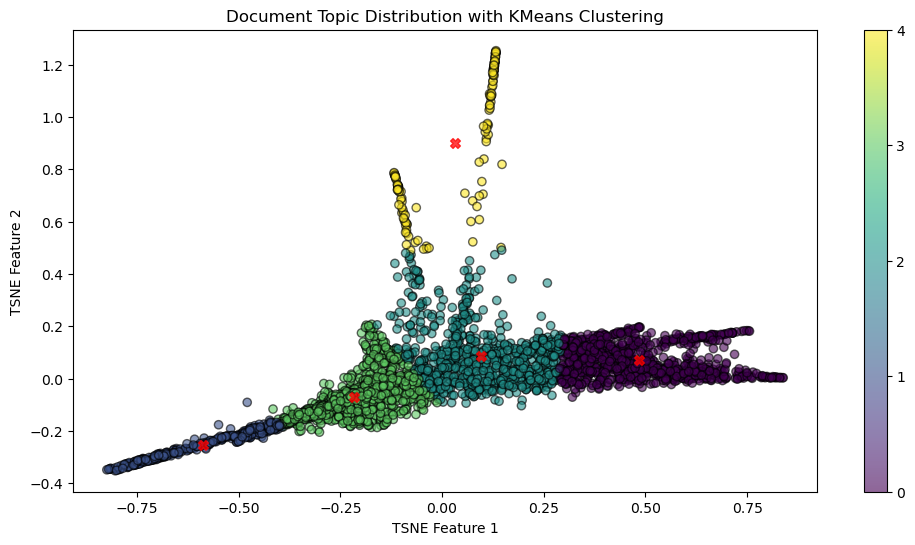

In [30]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# 运行t-SNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=250)
tsne_nmf = tsne_model.fit_transform(topic_data)

# 进行KMeans聚类
n_clusters = 5  # 假设我们想将文档分成5个聚类
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
clusters = kmeans.fit_predict(tsne_nmf)  # 注意这里我们对t-SNE的结果进行聚类

# 为每个聚类选择一个颜色
cmap = plt.get_cmap('viridis')

# 绘制美化后的t-SNE图，并按聚类着色
plt.figure(figsize=(12, 6))
scatter = plt.scatter(tsne_nmf[:, 0], tsne_nmf[:, 1], c=clusters, cmap=cmap, edgecolor='k', alpha=0.6)
plt.xlabel('TSNE Feature 1')
plt.ylabel('TSNE Feature 2')
plt.title('Document Topic Distribution with KMeans Clustering')
plt.colorbar(scatter, ticks=np.arange(n_clusters))

# 添加聚类中心点
# 注意：我们不需要再次使用tsne_model.fit_transform
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50, alpha=0.75, marker='X')

plt.show()


## 决策树

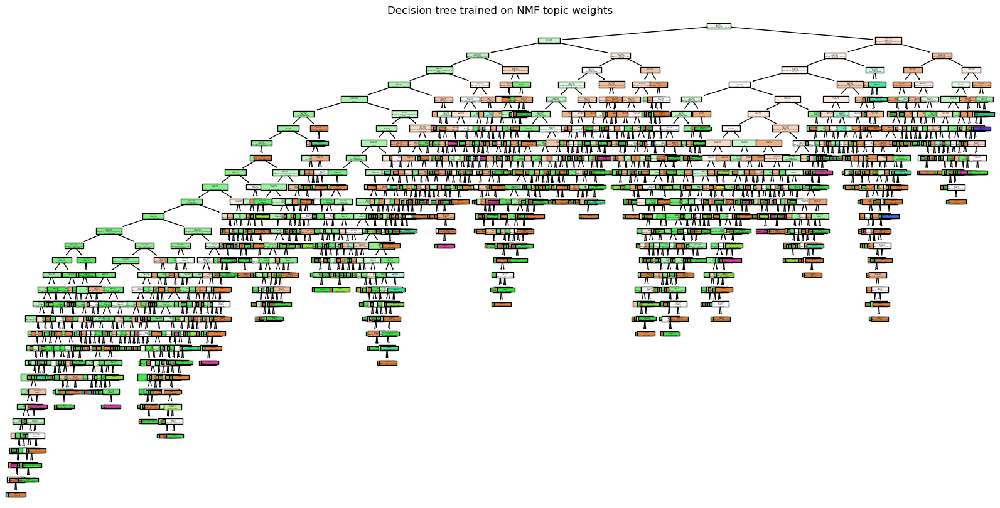

In [31]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# 使用NMF的主题权重作为特征，group_labels作为目标变量进行决策树训练
clf = DecisionTreeClassifier(random_state=0)
clf.fit(topic_data, group_labels)

# 决策树可视化
plt.figure(figsize=(20, 10))  # 可能需要调整尺寸以适合显示
plot_tree(clf, filled=True, class_names=np.unique(group_labels))
plt.title("Decision tree trained on NMF topic weights")
plt.show()
# 这段代码首先使用NMF模型转换后的主题权重topic_data和目标变量group_labels来训练一个决策树分类器。
# 然后，使用plot_tree函数对训练好的决策树模型进行可视化。这里，class_names=np.unique(group_labels)参数
# 用于指定决策树节点中显示的类别名称。

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3760 samples in 0.001s...
[t-SNE] Computed neighbors for 3760 samples in 0.334s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3760
[t-SNE] Computed conditional probabilities for sample 2000 / 3760
[t-SNE] Computed conditional probabilities for sample 3000 / 3760
[t-SNE] Computed conditional probabilities for sample 3760 / 3760
[t-SNE] Mean sigma: 0.105759
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.554871
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


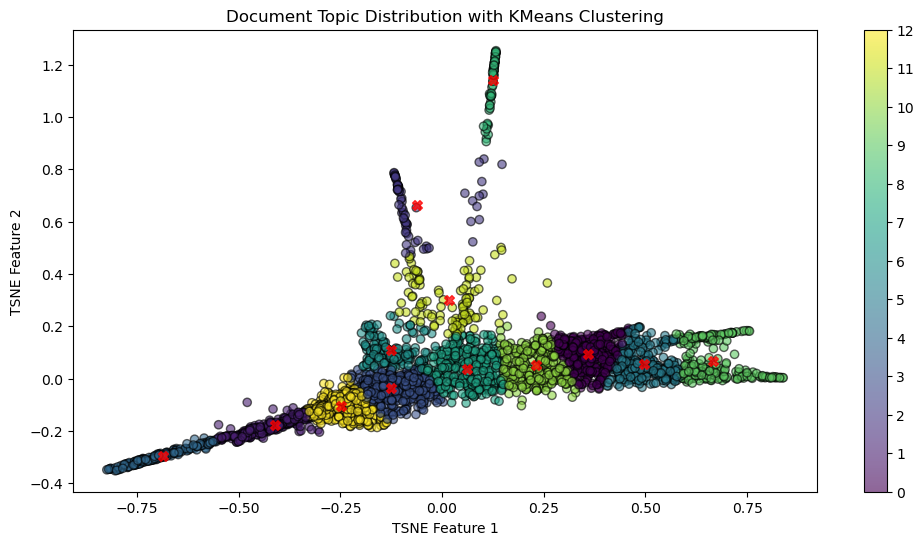

In [32]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# 运行t-SNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=250)
tsne_nmf = tsne_model.fit_transform(topic_data)

# 进行KMeans聚类
n_clusters = 13  # 假设我们想将文档分成5个聚类
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
clusters = kmeans.fit_predict(tsne_nmf)  # 注意这里我们对t-SNE的结果进行聚类

# 为每个聚类选择一个颜色
cmap = plt.get_cmap('viridis')

# 绘制美化后的t-SNE图，并按聚类着色
plt.figure(figsize=(12, 6))
scatter = plt.scatter(tsne_nmf[:, 0], tsne_nmf[:, 1], c=clusters, cmap=cmap, edgecolor='k', alpha=0.6)
plt.xlabel('TSNE Feature 1')
plt.ylabel('TSNE Feature 2')
plt.title('Document Topic Distribution with KMeans Clustering')
plt.colorbar(scatter, ticks=np.arange(n_clusters))

# 添加聚类中心点
# 注意：我们不需要再次使用tsne_model.fit_transform
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50, alpha=0.75, marker='X')

plt.show()


## 时间趋势分析和关联分析

In [37]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline
from topicwizard.pipeline import make_topic_pipeline
import numpy as np
from topicwizard.figures import topic_barcharts, word_map

corpus = df['Cleaned_Corpus'].tolist()
group_labels= df['Type'].tolist()


# Setting up topic modeling pipeline
bow_vectorizer = CountVectorizer(max_df=0.8, min_df=10, stop_words="english")
nmf = NMF(n_components=26)  # You can adjust the number of topics as needed

# Fitting the topic modeling pipeline
pipeline = make_pipeline(bow_vectorizer, nmf)
pipeline.fit(corpus)
topic_data = pipeline.transform(corpus)

# Display the shape of the topic data
print("Topic data shape:", topic_data.shape)

Topic data shape: (3760, 26)


In [39]:
# 假设 topic_data 是 NMF 转换的结果，它是一个 numpy 数组，形状为 (n_samples, n_topics=26)
# df 是原始的 DataFrame，包含了 'Cleaned_Corpus' 和 'Type'

# 确保为 df 添加主题权重列
for i in range(26):  # 有26个主题
    df[f'Topic_{i+1}'] = topic_data[:, i]  # 将每个主题权重作为新列添加到 df 中

# 检查这些列是否已经添加
print(df.head())  # 打印前几行以确认新列已经添加


   IDs                                             Author  Year  \
0    1  Hulcelle M.; Hemamou L.; Varni G.; Rollet N.; ...  2023   
1    2                                Perugia G.; Lisy D.  2023   
2    3          Narayan S.; Mazumdar A.P.; Vipparthi S.K.  2023   
3    4  Kim S.; Jang J.; Kang K.; Jin S.; Choi H.; Son...  2023   
4    5               Ma T.; Zhang Y.; Choi S.D.; Xiong S.  2023   

                            DOI  \
0       10.1145/3623809.3623973   
1    10.1007/s12369-023-01061-6   
2    10.1016/j.eswa.2023.120735   
3        10.1002/adma.202307070   
4  10.1016/j.apergo.2023.104100   

                                               Title  \
0  Leveraging Interactional Sociology for Trust A...   
1  Robot’s Gendering Trouble: A Scoping Review of...   
2  SBI-DHGR: Skeleton-based intelligent dynamic h...   
3  Injection-on-Skin Granular Adhesive for Intera...   
4  Modelling for design and evaluation of industr...   

                                            Abstr

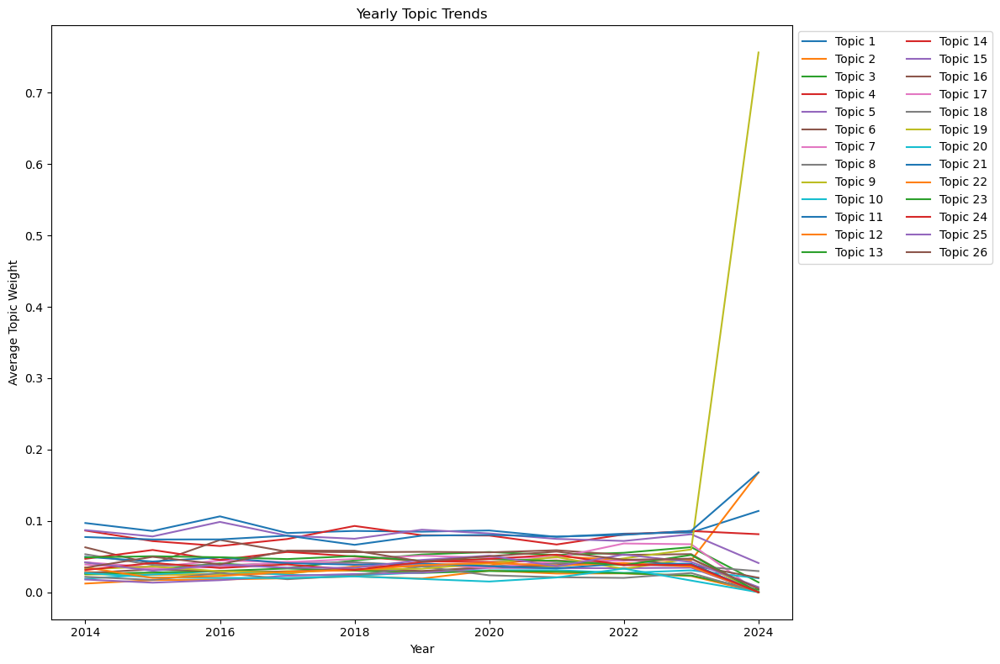

In [40]:
import matplotlib.pyplot as plt

# 计算每个年份中每个主题的平均权重
yearly_topic_trends = df.groupby('Year')[[f'Topic_{i+1}' for i in range(26)]].mean()

# 绘制时间趋势图
plt.figure(figsize=(12, 8))
for i in range(26):
    plt.plot(yearly_topic_trends.index, yearly_topic_trends[f'Topic_{i+1}'], label=f'Topic {i+1}')

plt.xlabel('Year')
plt.ylabel('Average Topic Weight')
plt.title('Yearly Topic Trends')

# 将图例放在图框外侧
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=2)  # 这里我把ncol改为2，以更好地展示图例
plt.tight_layout()
plt.show()



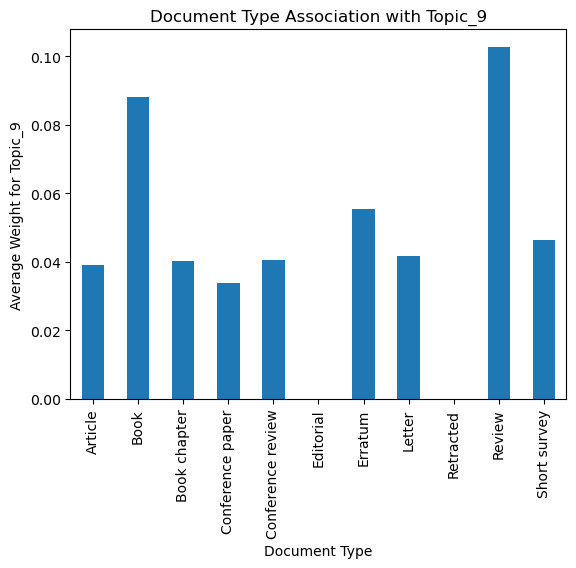

In [41]:
# 计算每种类型的文档在每个主题上的平均权重
type_topic_association = df.groupby('Type')[[f'Topic_{i+1}' for i in range(15)]].mean()

# 为了简化可视化，我们可以选择一个主题并绘制不同类型的平均权重
selected_topic = 'Topic_9'

type_topic_association[selected_topic].plot(kind='bar')
plt.xlabel('Document Type')
plt.ylabel(f'Average Weight for {selected_topic}')
plt.title(f'Document Type Association with {selected_topic}')
plt.show()


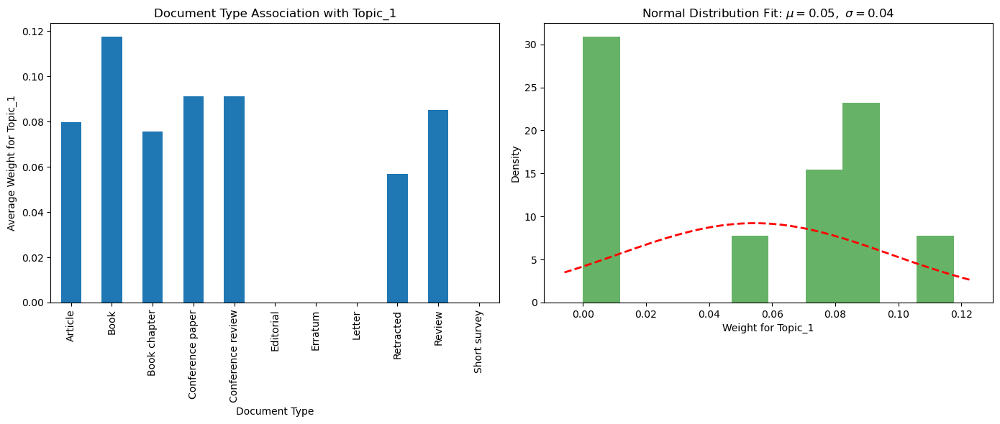

In [42]:
from scipy.stats import norm
# 计算每种类型的文档在每个主题上的平均权重
type_topic_association = df.groupby('Type')[[f'Topic_{i+1}' for i in range(15)]].mean()

# 为了简化可视化，我们可以选择一个主题并绘制不同类型的平均权重
selected_topic = 'Topic_1'

# 设置子图
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# 第一个子图: 绘制不同类型的文档在选定主题上的平均权重条形图
type_topic_association[selected_topic].plot(kind='bar', ax=axs[0])
axs[0].set_xlabel('Document Type')
axs[0].set_ylabel(f'Average Weight for {selected_topic}')
axs[0].set_title(f'Document Type Association with {selected_topic}')

# 第二个子图: 绘制直方图和正态分布拟合曲线
# 计算直方图数据
weights = type_topic_association[selected_topic].values
n, bins, patches = axs[1].hist(weights, bins=10, density=True, alpha=0.6, color='g')

# 拟合正态分布
mu, std = norm.fit(weights)

# 绘制PDF
xmin, xmax = axs[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
axs[1].plot(x, p, 'r--', linewidth=2)

# 设置图的其余部分
axs[1].set_title(f'Normal Distribution Fit: $\mu={mu:.2f},\ \sigma={std:.2f}$')
axs[1].set_xlabel(f'Weight for {selected_topic}')
axs[1].set_ylabel('Density')

plt.tight_layout()  # 调整整体布局
plt.show()

## topic-wizard 可视化

In [6]:
from topicwizard.pipeline import TopicPipeline

# 将 sklearn 的管道转换为 topicwizard 的 TopicPipeline
topic_pipeline = TopicPipeline.from_pipeline(pipeline)

# 准备主题数据
topic_data = topic_pipeline.prepare_topic_data(corpus)


Inferring topical content for documents.


In [7]:
# 生成和显示主题词条形图
topic_barcharts_fig = topic_barcharts(topic_data)
topic_barcharts_fig.show()

# 生成和显示词汇地图
word_map_fig = word_map(topic_data)
word_map_fig.show()


## 主题文档时间线

In [8]:
from topicwizard.figures import document_topic_timeline

# 假设选择第一个文档进行展示
document_index = 3  # 选择第一个文档

# 创建并显示文档的主题时间线
# 注意：实际使用时，你可能需要根据你的数据和需求调整参数
document_topic_timeline_fig = document_topic_timeline(topic_data, corpus[document_index])
document_topic_timeline_fig.show()


## topic for Word Importance (词汇与主题的关联条形图)

In [10]:
from topicwizard.figures import word_association_barchart

# 获取向量化器的词汇表
vocabulary = bow_vectorizer.vocabulary_

# 选择几个特定的词汇进行展示
selected_words = ["exoskeleton", "support", "comfort", "control", "limb"]

# 检查每个选定的词汇是否在词汇表中
for word in selected_words:
    if word in vocabulary:
        print(f"'{word}' is in the vocabulary.")
    else:
        print(f"'{word}' is NOT in the vocabulary.")


'exoskeleton' is in the vocabulary.
'support' is in the vocabulary.
'comfort' is in the vocabulary.
'control' is in the vocabulary.
'limb' is in the vocabulary.


In [11]:

# 创建并显示词汇与主题的关联条形图
word_association_barchart_fig = word_association_barchart(topic_data, selected_words)
word_association_barchart_fig.show()



## 主题词的词云图

In [ ]:
from topicwizard.figures import topic_wordclouds

# 创建并显示每个主题的词云图
topic_wordclouds_fig = topic_wordclouds(topic_data)
topic_wordclouds_fig.show()


## 交互式web

In [12]:
import topicwizard

# 启动 topicwizard 的Web应用进行交云式探索
topicwizard.visualize(topic_data=topic_data)


Preprocessing


[2024-04-14 23:12:36,459] ERROR in app: Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\flask\app.py", line 2190, in wsgi_app
    response = self.full_dispatch_request()
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\flask\app.py", line 1486, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\flask\app.py", line 1484, in full_dispatch_request
    rv = self.dispatch_request()
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\flask\app.py", line 1469, in dispatch_request
    return self.ensure_sync(self.view_functions[rule.endpoint])(**view_args)
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\dash\dash.py", line 1352, in dispatch
    ctx.run(
  File "c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\dash\_callback.py", line 450, in add_context
    output_value = _invoke_callback(func